## Hacer pruebas:

In [26]:
# import pylidc as pl
# from pylidc.utils import consensus
# import numpy as np
from skimage.measure import find_contours
# import matplotlib.pyplot as plt
# import torch
# import time
# import plotly.graph_objects as go
# import numpy as np
# from mayavi import mlab
# import cv2

In [2]:
from processLIDC import Patient

In [3]:
patient = Patient("LIDC-IDRI-0002")

Loading dicom files ... This may take a moment.


In [4]:
metodos = [m for m in dir(patient) if not '__' in m]
print(metodos) 

['get_all_nodules', 'get_mask', 'get_tensors', 'id_patient', 'imgs_scaled', 'mask', 'plot_mask', 'reconstruct_body', 'scale', 'scan', 'vol']


In [5]:
patient.get_all_nodules()

Paciente: LIDC-IDRI-0002
___________________________________
Paciente del nodulo: LIDC-IDRI-0002
Primera slice con el nodulo 171
num. slices nodulo: 28
-----------
Paciente del nodulo: LIDC-IDRI-0002
Primera slice con el nodulo 176
num. slices nodulo: 23
-----------
___________________________________


In [6]:
patient.plot_mask()

In [7]:
patient.reconstruct_body(nodulos = True)

117323


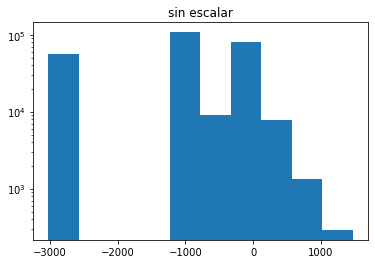

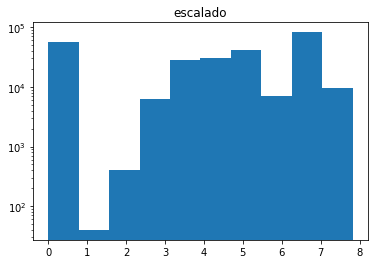

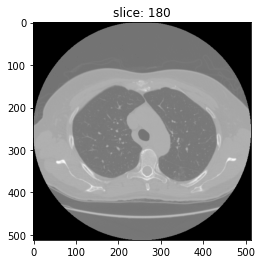

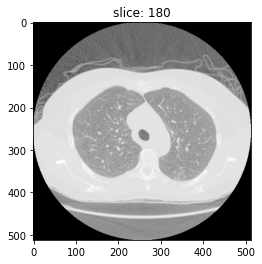

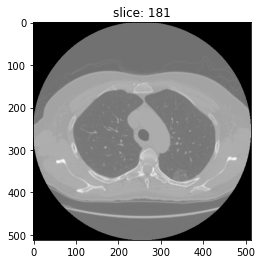

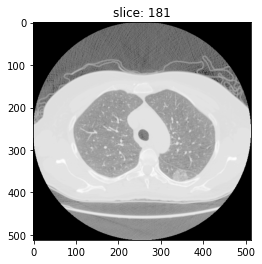

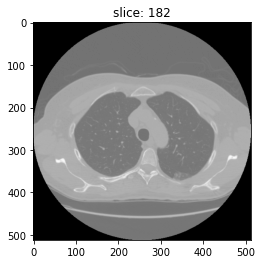

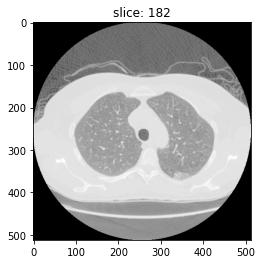

In [8]:
params = {'slices': (180, 185, 190),
          'plot': True,
          'with_mask': False}

patient.scale(**params)

## Inferencia:

In [48]:
# vuelvo a instanciar para liberara la ram:
patient = Patient("LIDC-IDRI-0002")
patient.scale()

Loading dicom files ... This may take a moment.


In [49]:
import torch

1. Descargar el modelo, UNET

In [50]:
model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
                       in_channels=3, out_channels=1, init_features=32, pretrained=True)

Using cache found in /home/faraujo/.cache/torch/hub/mateuszbuda_brain-segmentation-pytorch_master


Inspeccionemos el modelo:

In [81]:
print(model)

UNet(
  (encoder1): Sequential(
    (enc1conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc1norm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (enc1relu1): ReLU(inplace=True)
    (enc1conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc1norm2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (enc1relu2): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (encoder2): Sequential(
    (enc2conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc2norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (enc2relu1): ReLU(inplace=True)
    (enc2conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc2norm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

2. Obtener los tensores para pytorch (imagenes)

In [51]:
imgs, mask = patient.get_tensors(scaled=True)

In [52]:
print(imgs.shape)
print(imgs[0].shape)

torch.Size([261, 3, 256, 256])

3. Seleccionar imagenes para hacer inferencia y hacerla:

In [71]:
# slices:
primera = 180
ultima = 184

# Predecir:
pred = model(imgs[primera:ultima])
pred = torch.round(pred).detach().numpy()


Veamos qué ha salido:

In [72]:
import matplotlib.pyplot as plt

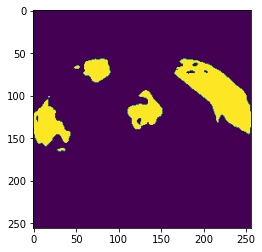

In [73]:
plt.imshow(pred[0].reshape(256,-1))
plt.show()

Es binaria la mascara predicha? Si, aunque preferiria un mapa de calor siendo proximo a 1 donde sea tumor y 0 donde no lo sea.

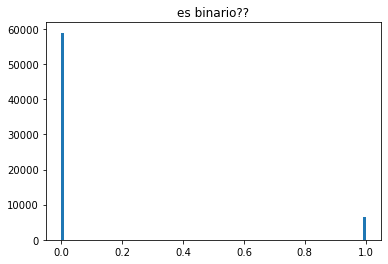

In [74]:
h = pred[0].reshape(-1)
plt.hist(h, bins = 100)
plt.title('es binario??')
plt.show()

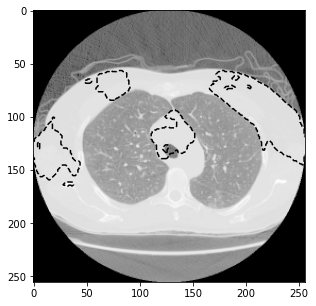

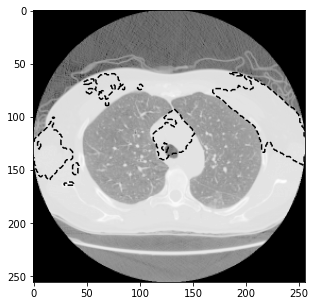

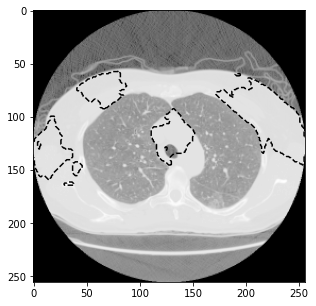

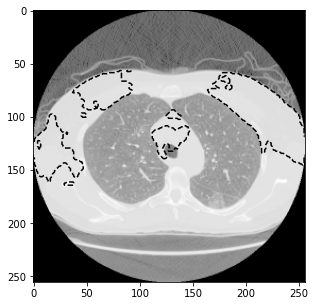

In [75]:
for k in range(ultima-primera):
    
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.imshow(imgs[k+primera, 0, :, :], cmap='gray')  # , alpha=0.5)

    for c in find_contours(pred[k, 0, :, :].astype(float), 0.5):
        plt.plot(c[:, 1], c[:, 0], '--k', label='Prediction')
    # plt.savefig(f"slice_pred_{k}.png")
   #  plt.close()

## Entrenar

In [79]:
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader


In [82]:
# Definir función de pérdida
loss_fn = nn.BCELoss()

# Definir optimizador
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

dataset = TensorDataset(imgs, mask)

# Crear el train_loader
batch_size = 10
train_loader = DataLoader(dataset,batch_size=9, shuffle=True)
for epoch in range(3):

    for batch_idx, (data, target) in enumerate(train_loader):
        # print(data.shape, target.shape)
        # # Forward pass
        output = model(data)
        # Calcular pérdida
        # plt.imshow(target[0])
        # plt.show()
        # print(data.shape, target.shape, output.shape)
        loss = loss_fn(output[:,0], target)

        # # # Calcular gradientes y actualizar parámetros
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Imprimir progreso
        if batch_idx % 10 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))


Train Epoch: 0 [0/261 (0%)]	Loss: 0.001847


KeyboardInterrupt: 